In [1]:
import os
import keras
import numpy as np
import tensorflow as tf

# Data
from keras.preprocessing.image import ImageDataGenerator


# Pre-Trained Models
from tensorflow.keras.applications import ResNet50V2

# Model
from keras import Sequential
from keras.layers import Dense
from keras.models import load_model
from keras.layers import Dropout
from keras.layers import GlobalAveragePooling2D

# Callbacks
from keras.callbacks import EarlyStopping, ModelCheckpoint
import numpy as np
import pandas as pd
from PIL import Image,ImageEnhance
from tensorflow.keras.preprocessing import image
from tensorflow.keras import layers,models
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing import image
from tensorflow.keras import optimizers, losses
from sklearn.model_selection import train_test_split
from pathlib import Path
import os.path
from sklearn.metrics import classification_report, confusion_matrix
import itertools
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
import matplotlib.pyplot as plt
from tqdm import tqdm
import os
import gc
import cv2

In [2]:
root_path = 'Dataset'
class_names = sorted(os.listdir(root_path))
class_names

['Corals',
 'Crabs',
 'Dolphin',
 'Eel',
 'Jelly Fish',
 'Lobster',
 'Nudibranchs',
 'Octopus',
 'Penguin',
 'Puffers',
 'Sea Rays',
 'Sea Urchins',
 'Seahorse',
 'Seal',
 'Sharks',
 'Squid',
 'Starfish',
 'Turtle_Tortoise',
 'Whale']

In [3]:
class_dis = [len(os.listdir(root_path + f"/{name}")) for name in class_names]
class_dis

[500,
 499,
 782,
 497,
 855,
 499,
 500,
 562,
 482,
 531,
 517,
 579,
 478,
 414,
 590,
 483,
 499,
 1903,
 572]

In [4]:
train_val_gen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    horizontal_flip = True,
    validation_split=0.1
)

test_gen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

# Load Data
train_ds = train_val_gen.flow_from_directory(root_path, target_size=(256,256), class_mode="binary", batch_size=32, shuffle=True, subset='training')
valid_ds = train_val_gen.flow_from_directory(root_path, target_size=(256,256), class_mode="binary", batch_size=32, shuffle=True, subset='validation')
test_ds = test_gen.flow_from_directory(root_path, target_size=(256,256), class_mode="binary", batch_size=32, subset='validation')

Found 10576 images belonging to 19 classes.
Found 1166 images belonging to 19 classes.
Found 2340 images belonging to 19 classes.


In [5]:
name="ResNet50V2"
# Load the Base Model
base_model = ResNet50V2(include_top=False, weights='imagenet', input_shape=(256,256,3))
base_model.trainable = False

# Model
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(256,activation='relu'),
    Dropout(0.2),
    Dense(len(class_names), activation='softmax')
], name=name)

# Compile Model
model.compile(
    loss='sparse_categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

# Callbacks
callbacks = [EarlyStopping(patience=5, restore_best_weights=True), ModelCheckpoint(name + ".h5", save_best_only=True)]

In [6]:
model.fit(train_ds, epochs=5, validation_data=valid_ds, callbacks=callbacks)

Epoch 1/5
331/331 [==============================] - 173s 484ms/step - loss: 0.8520 - accuracy: 0.7430 - val_loss: 0.5320 - val_accuracy: 0.8328


C:\Users\Martico09\anaconda3\envs\gpu\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/5
331/331 [==============================] - 152s 460ms/step - loss: 0.5662 - accuracy: 0.8257 - val_loss: 0.5386 - val_accuracy: 0.8250
Epoch 3/5
331/331 [==============================] - 146s 441ms/step - loss: 0.4850 - accuracy: 0.8470 - val_loss: 0.4868 - val_accuracy: 0.8473
Epoch 4/5
331/331 [==============================] - 138s 416ms/step - loss: 0.4276 - accuracy: 0.8621 - val_loss: 0.5324 - val_accuracy: 0.8276
Epoch 5/5
331/331 [==============================] - 136s 412ms/step - loss: 0.3732 - accuracy: 0.8790 - val_loss: 0.4817 - val_accuracy: 0.8499


In [7]:
#model.save('Model')

INFO:tensorflow:Assets written to: Model\assets


C:\Users\Martico09\anaconda3\envs\gpu\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


In [8]:
#Run loaded model
model=tf.keras.models.load_model('Model')

In [9]:
resnet50v2_loss, resnet50v2_acc = model.evaluate(test_ds)

74/74 [==============================] - 14s 180ms/step - loss: 0.3292 - accuracy: 0.9000


In [10]:
def show_image(img, title=None):
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')

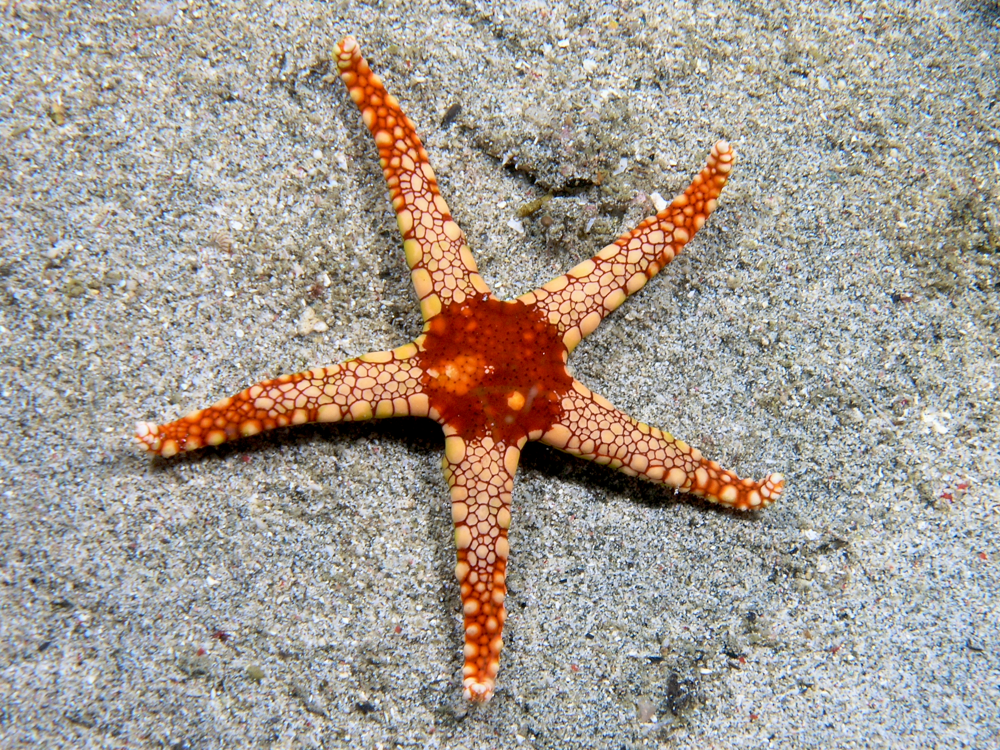

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]]


In [17]:
a = 'star.jpg'
test_image=image.load_img(a,target_size=(256,256))
img=Image.open(a)
display(img)
test_image=image.img_to_array(test_image)
test_image=np.expand_dims(test_image,axis=0)
np.argmax(model.predict(test_image))
print(model.predict(test_image))

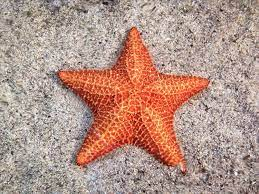

12

In [29]:
a = 'star2.jpeg'
test_image=image.load_img(a,target_size=(256,256))
img=Image.open(a)
display(img)
test_image=image.img_to_array(test_image)
test_image=np.expand_dims(test_image,axis=0)
np.argmax(model.predict(test_image))

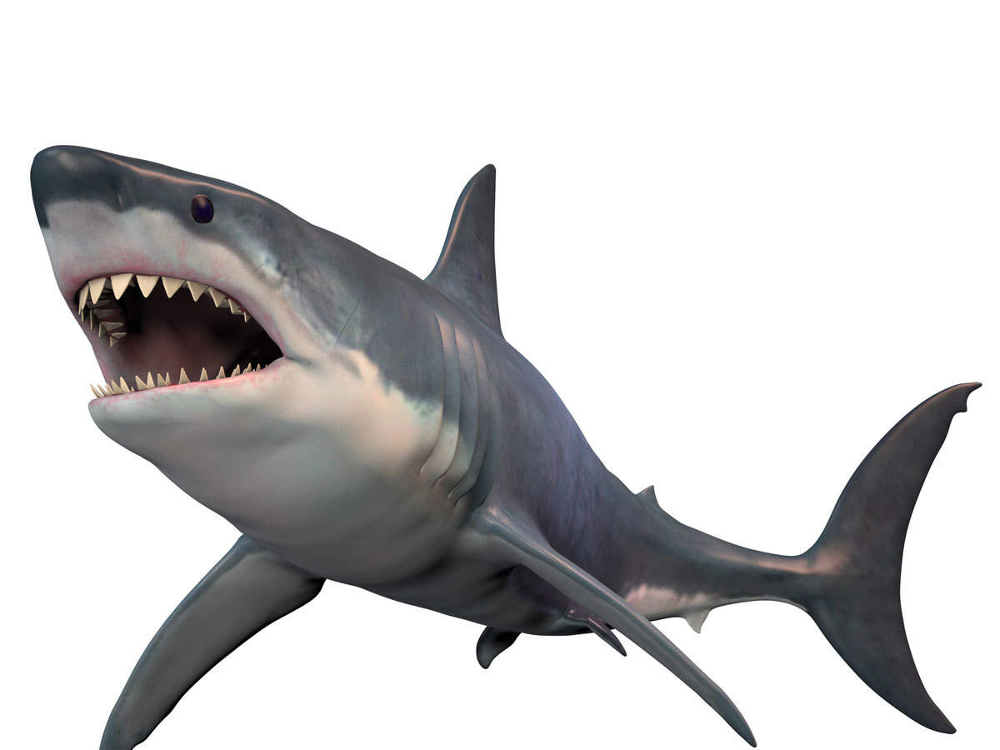

17

In [30]:
a = 'shark.jpg'
test_image=image.load_img(a,target_size=(256,256))
img=Image.open(a)
display(img)
test_image=image.img_to_array(test_image)
test_image=np.expand_dims(test_image,axis=0)
np.argmax(model.predict(test_image))

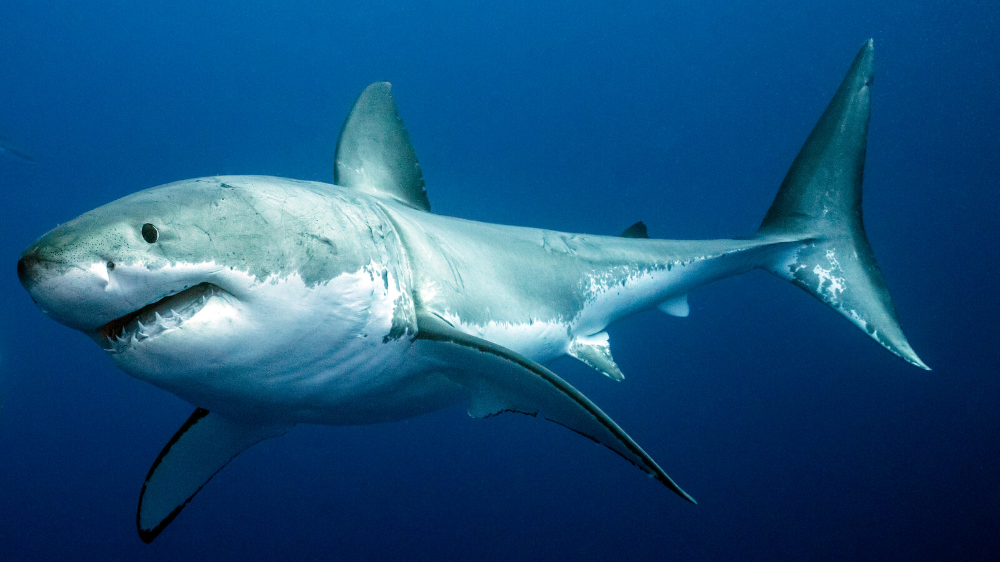

17

In [33]:
a = 'shark2.jpg'
test_image=image.load_img(a,target_size=(256,256))
img=Image.open(a)
display(img)
test_image=image.img_to_array(test_image)
test_image=np.expand_dims(test_image,axis=0)
np.argmax(model.predict(test_image))